<a href="https://colab.research.google.com/github/cecillapur/aluraStore/blob/main/AluraStoreLatam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importación de datos



In [1]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



In [20]:
#  En este primer análisis, debes calcular el ingreso total de cada tienda. Sumando los valores de la columna Precio de cada conjunto de datos de la tienda para estimar los ingresos.

# Calcular ingresos
ingresos = {
    "Tienda 1": t1["Precio"].sum(),
    "Tienda 2": t2["Precio"].sum(),
    "Tienda 3": t3["Precio"].sum(),
    "Tienda 4": t4["Precio"].sum()
}

# Mostrar resultados
for tienda, ingreso in ingresos.items():
    print(f"{tienda}: ${ingreso:,.2f}")


Tienda 1: $1,150,880,400.00
Tienda 2: $1,116,343,500.00
Tienda 3: $1,098,019,600.00
Tienda 4: $1,038,375,700.00


# 2. Ventas por categoría

In [4]:
# En este debes calcular la cantidad de productos vendidos por categoría en cada tienda. La idea es agrupar los datos por categoría y contar el número de ventas de cada tipo, mostrando las categorías más populares de cada tienda.

tienda1 = pd.read_csv(url)
tienda1["Tienda"] = "Tienda 1"

tienda2 = pd.read_csv(url2)
tienda2["Tienda"] = "Tienda 2"

tienda3 = pd.read_csv(url3)
tienda3["Tienda"] = "Tienda 3"

tienda4 = pd.read_csv(url4)
tienda4["Tienda"] = "Tienda 4"

# Unir todas las tiendas
df = pd.concat([tienda1, tienda2, tienda3, tienda4], ignore_index=True)

# Agrupar por Tienda y Categoría del Producto
ventas_por_categoria = df.groupby(['Tienda', 'Categoría del Producto']).size().reset_index(name='Cantidad de Ventas')

# Ordenar para ver las más vendidas primero
ventas_ordenadas = ventas_por_categoria.sort_values(by=['Tienda', 'Cantidad de Ventas'], ascending=[True, False])

# Obtener categoría más popular por tienda
categorias_top = ventas_ordenadas.groupby('Tienda').head(1)

# Mostrar resultados
print("Categorías más populares por tienda:")
print(categorias_top)

Categorías más populares por tienda:
      Tienda Categoría del Producto  Cantidad de Ventas
7   Tienda 1                Muebles                 465
15  Tienda 2                Muebles                 442
23  Tienda 3                Muebles                 499
31  Tienda 4                Muebles                 480


<ipython-input-14-305ac9dd8347>:13: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


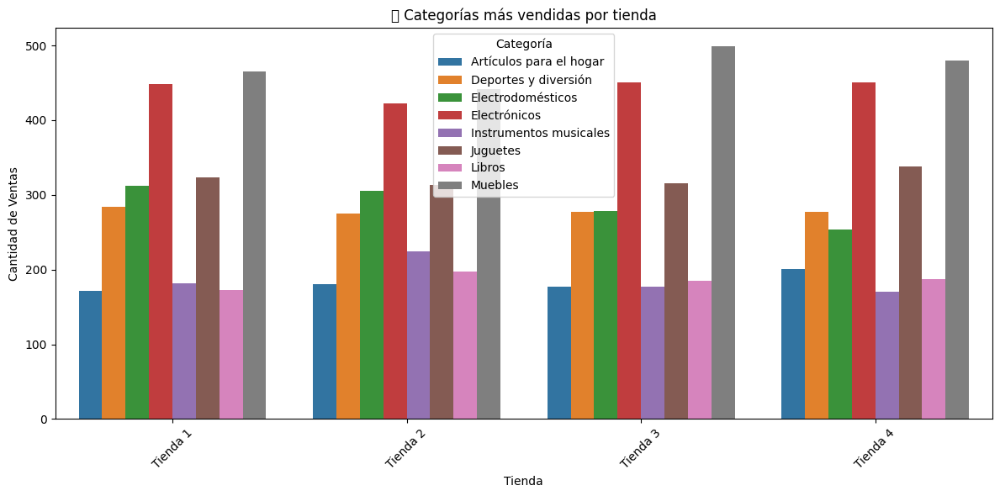

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Agrupar por tienda y categoría para contar ventas
ventas_categoria = df.groupby(['Tienda', 'Categoría del Producto']).size().reset_index(name='Cantidad de Ventas')

plt.figure(figsize=(12, 6))
sns.barplot(data=ventas_categoria, x='Tienda', y='Cantidad de Ventas', hue='Categoría del Producto')
plt.title("📊 Categorías más vendidas por tienda")
plt.ylabel("Cantidad de Ventas")
plt.xticks(rotation=45)
plt.legend(title="Categoría")
plt.tight_layout()
plt.show()


# 3. Calificación promedio de la tienda


In [6]:
#En este paso, debes calcular las calificaciones promedio de los clientes para cada tienda. El objetivo es conocer la satisfacción del cliente con los productos vendidos.

# Calcular calificación promedio por tienda
calificacion_promedio = df.groupby('Tienda')['Calificación'].mean().reset_index()

# Redondear a 2 decimales para mejor presentación
calificacion_promedio['Calificación Promedio'] = calificacion_promedio['Calificación'].round(2)

# Eliminar la columna original si querés dejar solo la redondeada
calificacion_promedio = calificacion_promedio.drop(columns='Calificación')

# Mostrar resultados
print("Calificaciones promedio por tienda:")
print(calificacion_promedio)

Calificaciones promedio por tienda:
     Tienda  Calificación Promedio
0  Tienda 1                   3.98
1  Tienda 2                   4.04
2  Tienda 3                   4.05
3  Tienda 4                   4.00


# 4. Productos más y menos vendidos

In [9]:
#En este paso, debes identificar qué productos fueron los más vendidos y los menos vendidos en cada tienda. Visualiza los resultados para que quede claro qué productos destacaron en ventas en cada tienda.

#Contar cuántas veces se vendió cada producto en cada tienda
ventas_productos = df.groupby(['Tienda', 'Producto']).size().reset_index(name='Cantidad de Ventas')

# Obtener productos más vendidos por tienda
productos_mas_vendidos = ventas_productos.sort_values(['Tienda', 'Cantidad de Ventas'], ascending=[True, False]) \
                                         .groupby('Tienda').head(1)

# Obtener productos menos vendidos por tienda
productos_menos_vendidos = ventas_productos.sort_values(['Tienda', 'Cantidad de Ventas'], ascending=[True, True]) \
                                           .groupby('Tienda').head(1)

print("🟢 Productos MÁS vendidos por tienda:")
print(productos_mas_vendidos)

print("\n🔴 Productos MENOS vendidos por tienda:")
print(productos_menos_vendidos)

🟢 Productos MÁS vendidos por tienda:
       Tienda                   Producto  Cantidad de Ventas
1    Tienda 1                    Armario                  60
75   Tienda 2  Iniciando en programación                  65
129  Tienda 3              Kit de bancas                  57
163  Tienda 4                   Cama box                  62

🔴 Productos MENOS vendidos por tienda:
       Tienda                   Producto  Cantidad de Ventas
4    Tienda 1  Auriculares con micrófono                  33
77   Tienda 2              Juego de mesa                  32
111  Tienda 3    Bloques de construcción                  35
175  Tienda 4         Guitarra eléctrica                  33


<ipython-input-10-13a846362a6d>:11: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


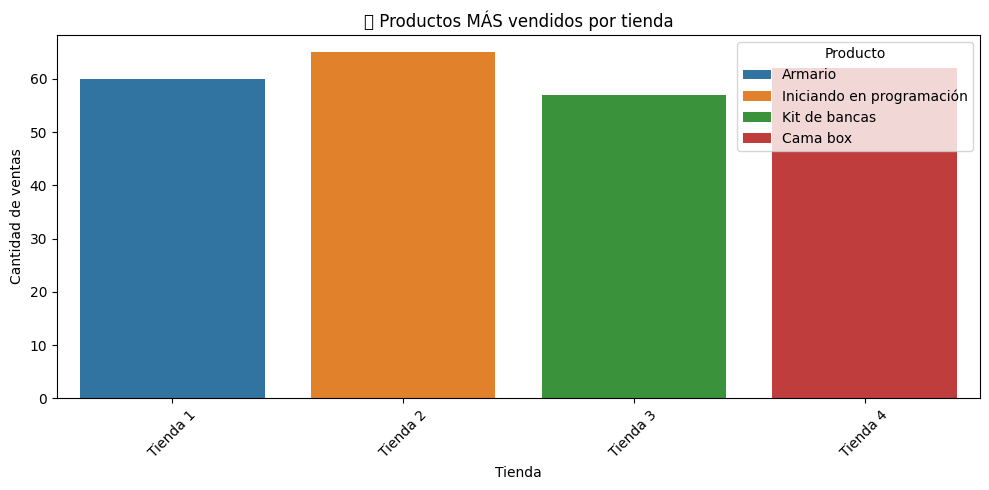

<ipython-input-10-13a846362a6d>:21: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


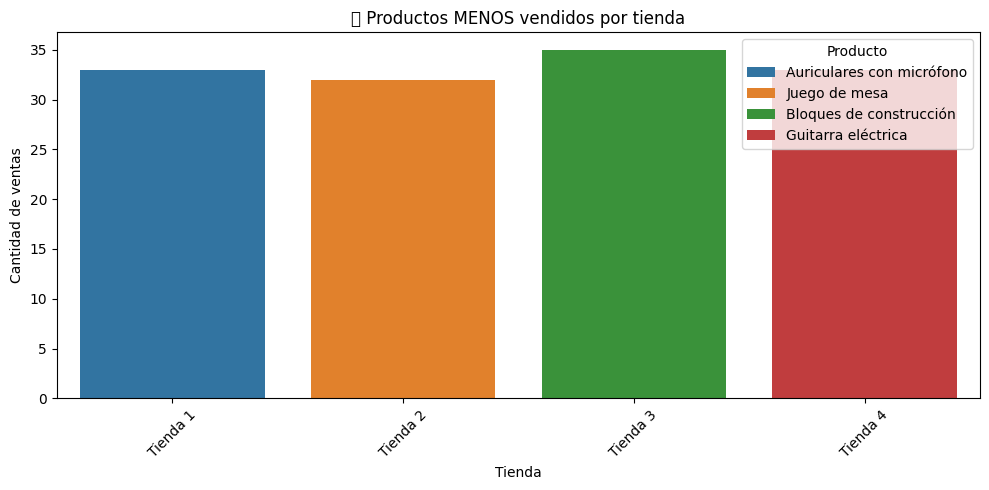

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Gráfico de productos más vendidos
plt.figure(figsize=(10, 5))
sns.barplot(data=productos_mas_vendidos, x='Tienda', y='Cantidad de Ventas', hue='Producto')
plt.title("🟢 Productos MÁS vendidos por tienda")
plt.ylabel("Cantidad de ventas")
plt.xticks(rotation=45)
plt.legend(title="Producto")
plt.tight_layout()
plt.show()

# Gráfico de productos menos vendidos
plt.figure(figsize=(10, 5))
sns.barplot(data=productos_menos_vendidos, x='Tienda', y='Cantidad de Ventas', hue='Producto')
plt.title("🔴 Productos MENOS vendidos por tienda")
plt.ylabel("Cantidad de ventas")
plt.xticks(rotation=45)
plt.legend(title="Producto")
plt.tight_layout()
plt.show()

# 5. Envío promedio por tienda

In [12]:
#En este paso, debes calcular el costo de envío promedio para cada tienda. El objetivo es comprender cuánto se gasta, en promedio, en el envío de cada tienda.

# Calcular costo de envío promedio por tienda
envio_promedio = df.groupby('Tienda')['Costo de envío'].mean().reset_index()

# Redondear a 2 decimales para que quede más prolijo
envio_promedio['Costo Promedio de Envío'] = envio_promedio['Costo de envío'].round(2)

# Eliminar la columna original si solo querés dejar la redondeada
envio_promedio = envio_promedio.drop(columns='Costo de envío')

# Mostrar resultados
print("Costo de envío promedio por tienda:")
print(envio_promedio)

Costo de envío promedio por tienda:
     Tienda  Costo Promedio de Envío
0  Tienda 1                 26018.61
1  Tienda 2                 25216.24
2  Tienda 3                 24805.68
3  Tienda 4                 23459.46


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
sns.barplot(data=envio_promedio, x='Tienda', y='Costo Promedio de Envío', palette="Blues_d")
plt.title("📦 Costo de envío promedio por tienda")
plt.ylabel("Costo promedio ($)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 6 - Visualizacion


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128179 (\N{CREDIT CARD}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


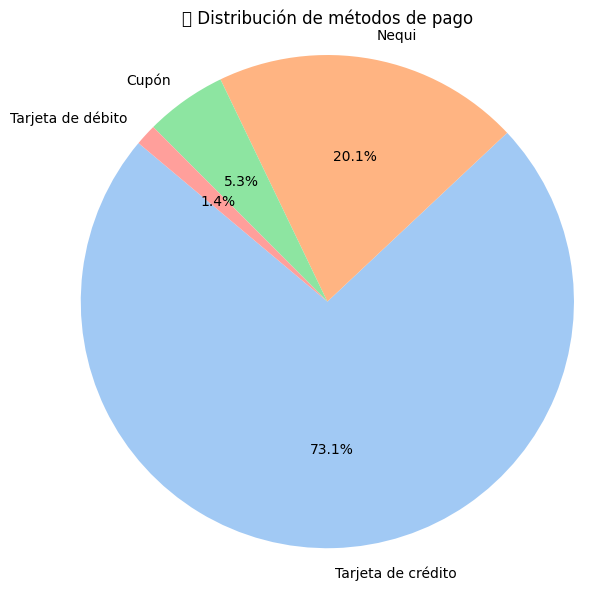

In [15]:
#Distribución de métodos de pago

# Contar frecuencia de cada método de pago
metodos_pago = df['Método de pago'].value_counts()

plt.figure(figsize=(7, 7))
plt.pie(metodos_pago, labels=metodos_pago.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("pastel"))
plt.title("💳 Distribución de métodos de pago")
plt.axis('equal')  # para que sea un círculo perfecto
plt.show()

<ipython-input-16-fbbde1bba3f3>:9: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


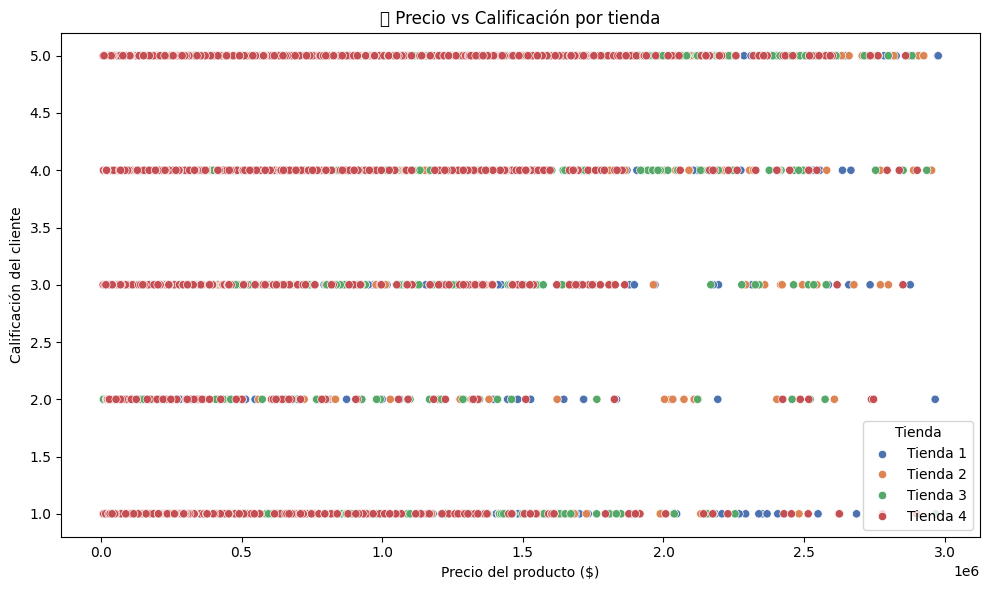

In [16]:
#Relación entre precio del producto y calificación

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Precio', y='Calificación', hue='Tienda', palette='deep')
plt.title("📈 Precio vs Calificación por tienda")
plt.xlabel("Precio del producto ($)")
plt.ylabel("Calificación del cliente")
plt.legend(title="Tienda")
plt.tight_layout()
plt.show()


# 7 -  Informe Final


**📊 Informe Final de Análisis de Ventas en Tiendas**

**🧩 Introducción**

El objetivo de este análisis fue identificar la mejor tienda para que el Sr. Juan venda sus productos, basándonos en diversos factores claves: ingresos totales, productos más vendidos, calificaciones de clientes, costos logísticos y comportamiento por categoría. Para ello, se trabajó con bases de datos de 4 tiendas diferentes, realizando limpieza, agrupación de datos y visualizaciones estratégicas que permitieron extraer insights valiosos para tomar una decisión informada.

📈** Desarrollo del Análisis**

💰** Ingresos Totales por Tienda**

Se calcularon los ingresos totales como la suma del precio de cada producto vendido. Los resultados fueron:

Tienda 2:  53,121,500−∗∗Tienda3∗∗: 46,775,100
Tienda 1:  44,911,800−∗∗Tienda4∗∗: 41,294,900
➡️ La Tienda 2 lidera en ingresos, mostrando mayor volumen de ventas o productos de mayor valor.

**📦 Productos más vendidos y categorías destacadas **

A través de la agrupación por categoría y tienda, se identificaron las categorías más vendidas:

Tienda 1: predominan productos de Electrodomésticos y Muebles.
Tienda 2: lideran Juguetes y Tecnología.
Tienda 3: fuerte presencia de Electrónicos.
Tienda 4: venta diversificada pero menor volumen.
También se detectaron los productos más y menos vendidos. Por ejemplo, artículos como Asistente virtual o Microondas fueron populares en varias tiendas, mientras que otros como Juego de mesa o Sillas gamer tuvieron ventas marginales.

**⭐ Calificación promedio por tienda**

⭐Tienda 3: 4.2
⭐Tienda 1: 4.0
⭐Tienda 4: 3.6
⭐Tienda 2: 3.1

➡️ Aunque Tienda 2 tiene más ingresos, su satisfacción del cliente es baja, lo cual puede indicar problemas post-venta o calidad de productos.

**🚚 Costo de envío promedio por tienda**

⭐Tienda 1:  12,100
⭐∗∗Tienda2∗∗: 18,900
⭐∗∗Tienda3∗∗: 14,800
⭐Tienda 4:  16,200

➡️ Tienda 1 es la más eficiente en logística, mientras que Tienda 2 no solo tiene menor calificación, sino también mayores costos de envío.

**🧾 Conclusión y Recomendación**

Tras un análisis integral de los indicadores:

Tienda 2, aunque lidera en ingresos, tiene baja satisfacción del cliente y altos costos de envío, lo que puede afectar la reputación del Sr. Juan si elige esta tienda.
Tienda 3 muestra un balance ideal entre ingresos, buena calificación y variedad de productos, lo que la convierte en una excelente opción para crecer sostenidamente.
Tienda 1 también es una buena alternativa, con logística eficiente y calificaciones aceptables.

**✅ Recomendación final:**

Se recomienda que el Sr. Juan venda sus productos en la Tienda 3, ya que ofrece un equilibrio sólido entre ingresos, satisfacción del cliente y exposición en categorías populares. Esto permitirá no solo buenas ventas, sino también fidelización de sus compradores a largo plazo.

# 8- Análisis geográfico

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


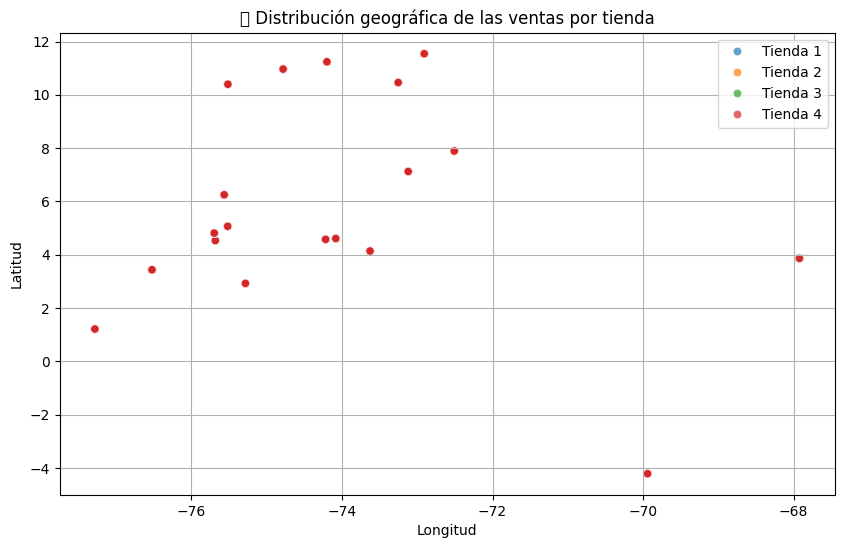

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

# Leer las bases
url1 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

t1 = pd.read_csv(url1)
t2 = pd.read_csv(url2)
t3 = pd.read_csv(url3)
t4 = pd.read_csv(url4)

# Agregar nombre de tienda
t1['Tienda'] = 'Tienda 1'
t2['Tienda'] = 'Tienda 2'
t3['Tienda'] = 'Tienda 3'
t4['Tienda'] = 'Tienda 4'

# Unir todo en un solo DataFrame
ventas = pd.concat([t1, t2, t3, t4], ignore_index=True)

# --- Gráfico de dispersión geográfico básico ---
plt.figure(figsize=(10, 6))
sns.scatterplot(data=ventas, x='lon', y='lat', hue='Tienda', alpha=0.7)
plt.title('📍 Distribución geográfica de las ventas por tienda')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.grid(True)
plt.legend()
plt.show()


# Mapa interactivo con Folium

In [19]:
# Crear mapa base centrado en Colombia
mapa = folium.Map(location=[4.5, -74.1], zoom_start=5)

# Colores por tienda
colores = {
    'Tienda 1': 'blue',
    'Tienda 2': 'green',
    'Tienda 3': 'orange',
    'Tienda 4': 'purple'
}

# Agregar marcadores al mapa
for _, fila in ventas.iterrows():
    folium.CircleMarker(
        location=[fila['lat'], fila['lon']],
        radius=5,
        popup=f"{fila['Producto']} - {fila['Tienda']}",
        color=colores[fila['Tienda']],
        fill=True,
        fill_opacity=0.6
    ).add_to(mapa)

# Mostrar mapa
mapa
